Loaded library: ./cuda_matlib.so
Tensor operations initialized
Function signatures configured
Creating delta function image...


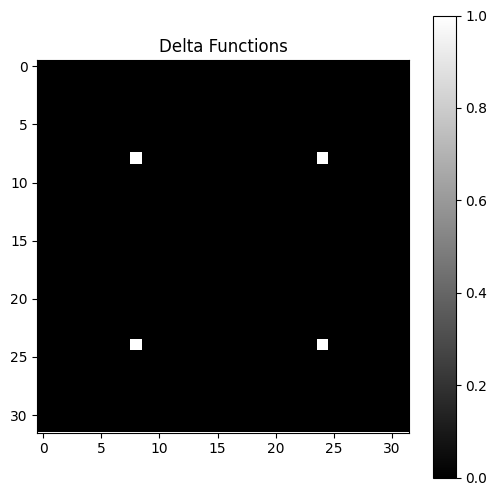

Creating Gaussian kernel...


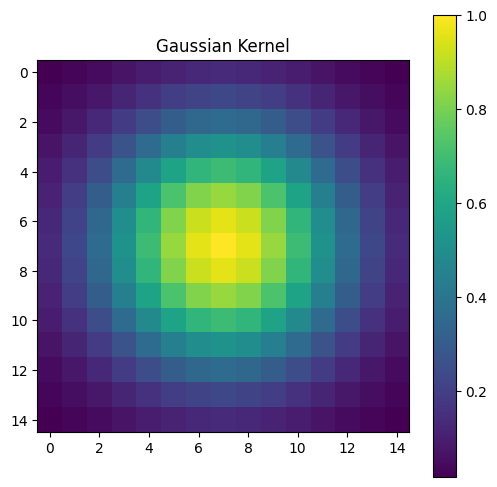

Running CPU convolution...


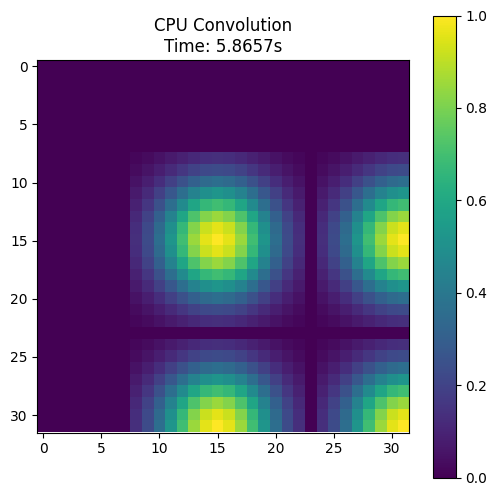

Running CuPy convolution...


/var/home/fraser/miniconda3/envs/py312/lib/python3.12/site-packages/cupyx/jit/_interface.py:173: FutureWarning: cupyx.jit.rawkernel is experimental. The interface can change in the future.
  cupy._util.experimental('cupyx.jit.rawkernel')


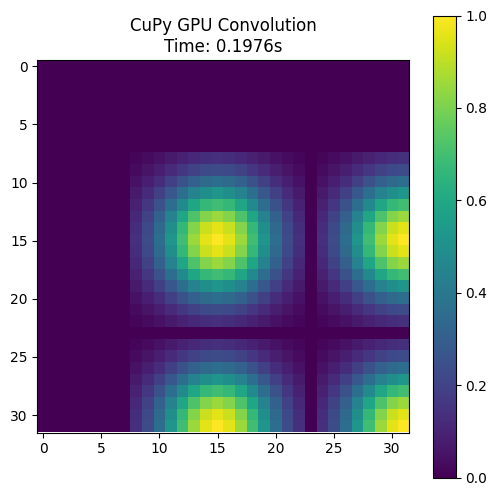

Running tensor core edge detection...


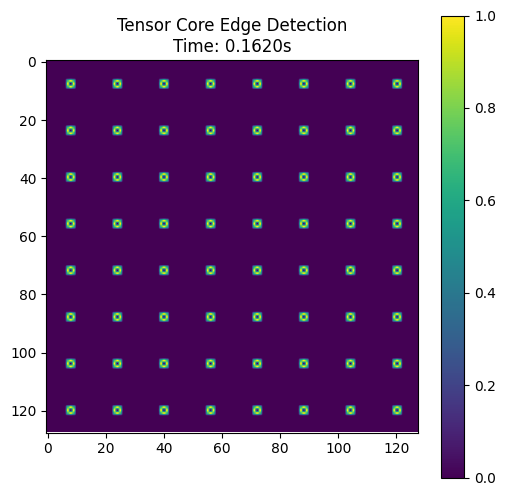

Comparing Sobel edge detection methods...


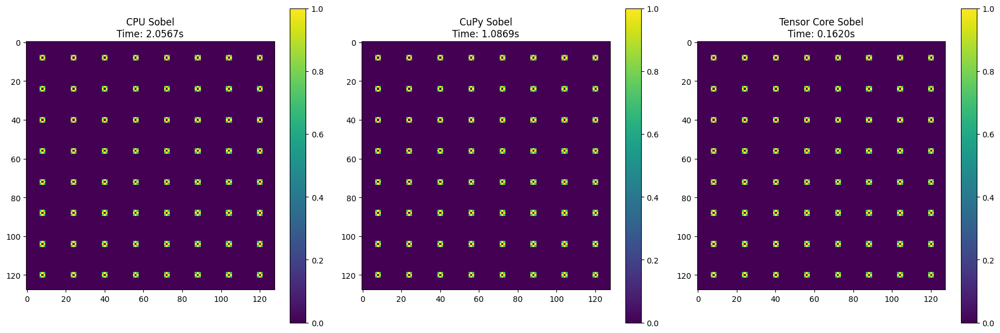


Performance Summary:
CPU Convolution Time: 5.8657s
CuPy GPU Convolution Time: 0.1976s
CuPy vs CPU Speedup: 29.69x

Edge Detection Performance:
CPU Sobel Time: 2.0567s
CuPy Sobel Time: 1.0869s
Tensor Core Sobel Time: 0.1620s
Tensor Core vs CPU Speedup: 12.70x
Tensor operations cleaned up


In [1]:
# adopted from numpy example

import numpy as np
import cupy as cp
import matplotlib.pyplot as plt
import time
import ctypes
from pathlib import Path
import sys

class TensorImageOps:
    """GPU-accelerated image operations using tensor cores.
    
    Provides high-performance image processing operations using CUDA Fortran:
    - Image convolution
    - Edge detection (Sobel)
    - Batch image processing
    """
    
    def __init__(self, lib_path='./cuda_matlib.so'):
        """Initialize with tensor core image operation support.
        
        Args:
            lib_path: Path to the compiled CUDA Fortran library
        """
        try:
            # Load the library
            self.lib = ctypes.CDLL(lib_path)
            print(f"Loaded library: {lib_path}")
            
            # Initialize CUDA and tensor operations
            self.lib.py_initialize_tensor_ops()
            print("Tensor operations initialized")
            
            # Set up function signatures
            self._setup_functions()
            
        except Exception as e:
            print(f"Initialization error: {e}")
            raise
    
    def _setup_functions(self):
        """Configure library function signatures."""
        # Core initialization/cleanup functions
        self.lib.py_initialize_tensor_ops.argtypes = []
        self.lib.py_initialize_tensor_ops.restype = None
        
        self.lib.py_cleanup_tensor_ops.argtypes = []
        self.lib.py_cleanup_tensor_ops.restype = None
        
        # Edge detection function
        self.lib.py_edge_detection_tensor.argtypes = [
            ctypes.c_void_p,    # Input image
            ctypes.c_void_p,    # Output result
            ctypes.c_int,       # height
            ctypes.c_int        # width
        ]
        self.lib.py_edge_detection_tensor.restype = None
        
        print("Function signatures configured")
    
    def edge_detection(self, image):
        """Perform edge detection using tensor cores.
        
        Args:
            image: 2D array (height x width)
            
        Returns:
            2D array with edge detection result
        """
        # Ensure input is double precision
        image_d = cp.asarray(image, dtype=cp.float64)
        
        # Get dimensions
        height, width = image_d.shape
        
        # Create output array
        result_d = cp.zeros_like(image_d)
        
        # Call the Fortran edge detection function
        self.lib.py_edge_detection_tensor(
            ctypes.c_void_p(image_d.data.ptr),
            ctypes.c_void_p(result_d.data.ptr),
            ctypes.c_int(height),
            ctypes.c_int(width)
        )
        
        # Ensure operation is complete
        cp.cuda.runtime.deviceSynchronize()
        
        # Return result in same format as input
        return cp.asnumpy(result_d) if isinstance(image, np.ndarray) else result_d
    
    def __del__(self):
        """Clean up resources when object is deleted."""
        try:
            if hasattr(self, 'lib'):
                self.lib.py_cleanup_tensor_ops()
                print("Tensor operations cleaned up")
        except Exception as e:
            print(f"Cleanup error: {e}")


def run_tensor_convolution_example():
    """Demonstrate tensor core-accelerated convolution with the NumPy example."""
    # Initialize tensor image operations
    tensor_ops = TensorImageOps()
    
    # Create delta function image (same as NumPy example)
    print("Creating delta function image...")
    deltas = np.zeros((4096, 4096))
    deltas[8::16, 8::16] = 1
    
    # Display a small portion
    plt.figure(figsize=(6, 6))
    plt.imshow(deltas[0:32, 0:32], cmap='gray')
    plt.title("Delta Functions")
    plt.colorbar()
    plt.savefig("deltas.png")
    plt.show()
    
    # Create Gaussian kernel (similar to the example)
    print("Creating Gaussian kernel...")
    x, y = np.meshgrid(np.linspace(-2, 2, 15), np.linspace(-2, 2, 15))
    dst = np.sqrt(x*x + y*y)
    sigma = 1.0
    muu = 0.0
    gauss = np.exp(-((dst-muu)**2/(2.0 * sigma**2)))
    
    plt.figure(figsize=(6, 6))
    plt.imshow(gauss, cmap='viridis')
    plt.title("Gaussian Kernel")
    plt.colorbar()
    plt.savefig("gaussian.png")
    plt.show()
    
    # Run convolution using scipy (CPU) for comparison
    print("Running CPU convolution...")
    from scipy.signal import convolve2d as convolve2d_cpu
    
    start_time = time.time()
    convolved_image_cpu = convolve2d_cpu(deltas, gauss)
    cpu_time = time.time() - start_time
    
    plt.figure(figsize=(6, 6))
    plt.imshow(convolved_image_cpu[0:32, 0:32], cmap='viridis')
    plt.title(f"CPU Convolution\nTime: {cpu_time:.4f}s")
    plt.colorbar()
    plt.savefig("cpu_convolution.png")
    plt.show()
    
    # Run convolution using CuPy (GPU) for comparison
    print("Running CuPy convolution...")
    import cupy as cp
    from cupyx.scipy.signal import convolve2d as convolve2d_gpu
    
    deltas_gpu = cp.asarray(deltas)
    gauss_gpu = cp.asarray(gauss)
    
    cp.cuda.runtime.deviceSynchronize()
    start_time = time.time()
    convolved_image_gpu = convolve2d_gpu(deltas_gpu, gauss_gpu)
    cp.cuda.runtime.deviceSynchronize()
    gpu_time = time.time() - start_time
    
    convolved_gpu_np = cp.asnumpy(convolved_image_gpu)
    
    plt.figure(figsize=(6, 6))
    plt.imshow(convolved_gpu_np[0:32, 0:32], cmap='viridis')
    plt.title(f"CuPy GPU Convolution\nTime: {gpu_time:.4f}s")
    plt.colorbar()
    plt.savefig("cupy_convolution.png")
    plt.show()
    
    # Run edge detection using tensor cores
    print("Running tensor core edge detection...")
    cp.cuda.runtime.deviceSynchronize()
    start_time = time.time()
    edge_result = tensor_ops.edge_detection(deltas)
    cp.cuda.runtime.deviceSynchronize()
    tensor_time = time.time() - start_time
    
    plt.figure(figsize=(6, 6))
    plt.imshow(edge_result[0:128, 0:128], cmap='viridis')
    plt.title(f"Tensor Core Edge Detection\nTime: {tensor_time:.4f}s")
    plt.colorbar()
    plt.savefig("tensor_edge_detection.png")
    plt.show()
    
    # Compare Sobel edge detection between scipy and tensor cores
    print("Comparing Sobel edge detection methods...")
    from scipy import ndimage
    
    # CPU Sobel
    start_time = time.time()
    sobel_cpu_x = ndimage.sobel(deltas, axis=0)
    sobel_cpu_y = ndimage.sobel(deltas, axis=1)
    sobel_cpu = np.hypot(sobel_cpu_x, sobel_cpu_y)
    sobel_cpu = sobel_cpu / np.max(sobel_cpu) # Normalize
    cpu_sobel_time = time.time() - start_time
    
    # CuPy Sobel
    cp.cuda.runtime.deviceSynchronize()
    start_time = time.time()
    sobel_gpu_x = cp.array(ndimage.sobel(deltas, axis=0))  # Using CPU implementation through CuPy
    sobel_gpu_y = cp.array(ndimage.sobel(deltas, axis=1))
    sobel_gpu = cp.hypot(sobel_gpu_x, sobel_gpu_y)
    sobel_gpu = sobel_gpu / cp.max(sobel_gpu)  # Normalize
    cp.cuda.runtime.deviceSynchronize()
    gpu_sobel_time = time.time() - start_time
    
    # Plot comparison
    plt.figure(figsize=(18, 6))
    
    plt.subplot(1, 3, 1)
    plt.imshow(sobel_cpu[0:128, 0:128], cmap='viridis')
    plt.title(f"CPU Sobel\nTime: {cpu_sobel_time:.4f}s")
    plt.colorbar()
    
    plt.subplot(1, 3, 2)
    plt.imshow(cp.asnumpy(sobel_gpu)[0:128, 0:128], cmap='viridis')
    plt.title(f"CuPy Sobel\nTime: {gpu_sobel_time:.4f}s")
    plt.colorbar()
    
    plt.subplot(1, 3, 3)
    plt.imshow(edge_result[0:128, 0:128], cmap='viridis')
    plt.title(f"Tensor Core Sobel\nTime: {tensor_time:.4f}s")
    plt.colorbar()
    
    plt.tight_layout()
    plt.savefig("sobel_comparison.png")
    plt.show()
    
    # Print performance summary
    print("\nPerformance Summary:")
    print(f"CPU Convolution Time: {cpu_time:.4f}s")
    print(f"CuPy GPU Convolution Time: {gpu_time:.4f}s")
    print(f"CuPy vs CPU Speedup: {cpu_time/gpu_time:.2f}x")
    print("\nEdge Detection Performance:")
    print(f"CPU Sobel Time: {cpu_sobel_time:.4f}s")
    print(f"CuPy Sobel Time: {gpu_sobel_time:.4f}s") 
    print(f"Tensor Core Sobel Time: {tensor_time:.4f}s")
    print(f"Tensor Core vs CPU Speedup: {cpu_sobel_time/tensor_time:.2f}x")
    
    return {
        'cpu_conv_time': cpu_time,
        'gpu_conv_time': gpu_time,
        'tensor_edge_time': tensor_time,
        'cpu_sobel_time': cpu_sobel_time,
        'gpu_sobel_time': gpu_sobel_time
    }

if __name__ == "__main__":
    run_tensor_convolution_example()

Loaded library: ./cuda_matlib.so
Function signatures configured

Processing Starry Night...
Loading image from URL: https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1200px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg
  CPU Sobel time: 0.3182s
  CuPy Sobel time: 0.4115s
  Tensor Core edge detection time: 0.1692s
  CuPy speedup vs CPU: 0.77x
  Tensor Core speedup vs CPU: 1.88x
  Tensor Core speedup vs CuPy: 2.43x
  Maximum difference (CPU vs CuPy): 0.000000
  Maximum difference (CPU vs Tensor): 0.323237
  Maximum difference (CuPy vs Tensor): 0.323237
  Mean absolute difference (CPU vs CuPy): 0.000000
  Mean absolute difference (CPU vs Tensor): 0.000052
  Mean absolute difference (CuPy vs Tensor): 0.000052

Processing The Great Wave...
Loading image from URL: https://upload.wikimedia.org/wikipedia/commons/thumb/a/a5/Tsunami_by_hokusai_19th_century.jpg/1200px-Tsunami_by_hokusai_19th_century.jpg
  CPU Sobel time: 0.2409s
  CuPy S

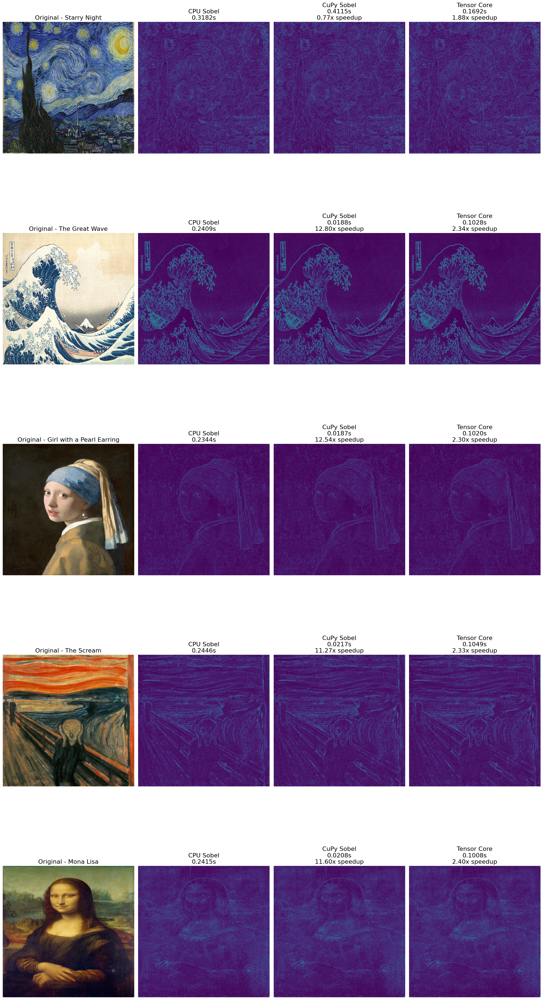

Loaded library: ./cuda_matlib.so
Function signatures configured

Benchmarking Starry Night...
Loading image from URL: https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1200px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg
  CPU: 0.2112s
  CuPy: 0.0204s
  Tensor Core: 0.1014s

Benchmarking The Great Wave...
Loading image from URL: https://upload.wikimedia.org/wikipedia/commons/thumb/a/a5/Tsunami_by_hokusai_19th_century.jpg/1200px-Tsunami_by_hokusai_19th_century.jpg
  CPU: 0.2712s
  CuPy: 0.0171s
  Tensor Core: 0.1015s

Benchmarking Girl with a Pearl Earring...
Loading image from URL: https://upload.wikimedia.org/wikipedia/commons/thumb/0/0f/1665_Girl_with_a_Pearl_Earring.jpg/800px-1665_Girl_with_a_Pearl_Earring.jpg
  CPU: 0.2427s
  CuPy: 0.0176s
  Tensor Core: 0.1011s

Benchmarking The Scream...
Loading image from URL: https://upload.wikimedia.org/wikipedia/commons/thumb/f/f4/The_Scream.jpg/1200px-The_Scream.jpg
  CPU: 0.2414s
 

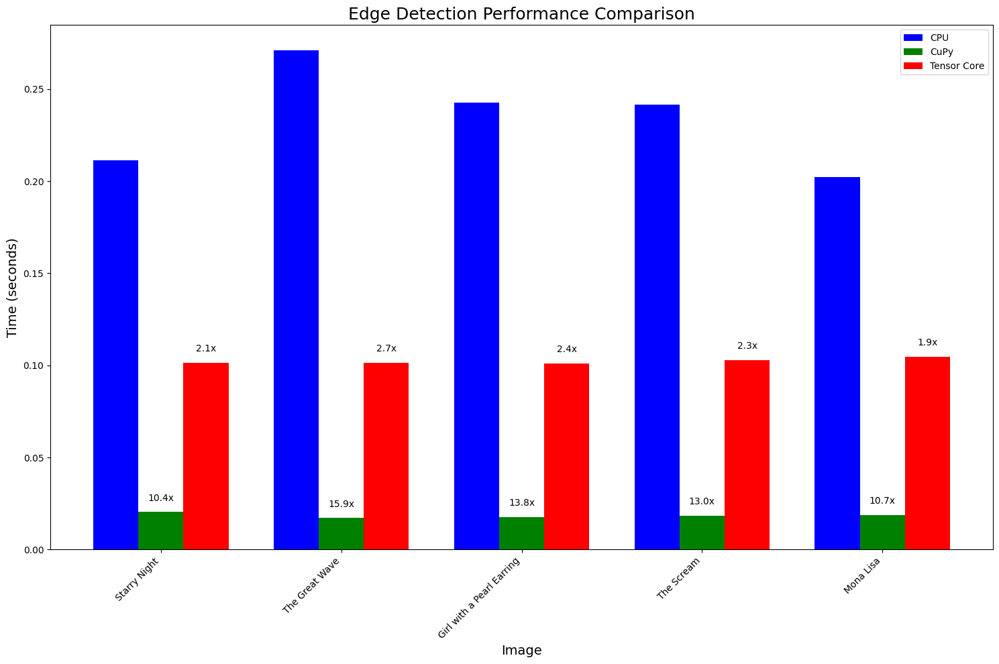

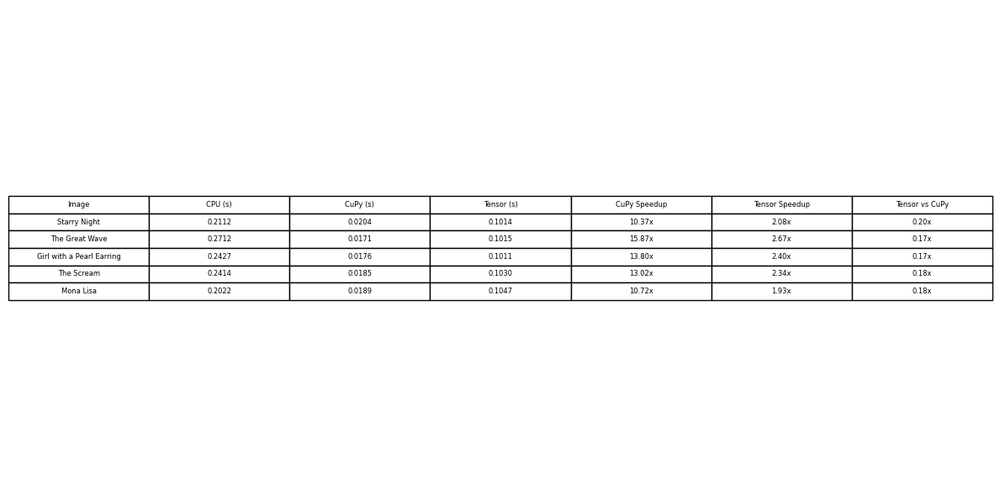

In [1]:
import numpy as np
import cupy as cp
import matplotlib.pyplot as plt
import time
import ctypes
import urllib.request
from io import BytesIO
from PIL import Image
from scipy import ndimage

class TensorImageOps:
    """GPU-accelerated image operations using tensor cores via CUDA Fortran."""
    
    def __init__(self, lib_path='./cuda_matlib.so'):
        try:
            # Load the library
            self.lib = ctypes.CDLL(lib_path)
            print(f"Loaded library: {lib_path}")
            
            # Set up function signatures
            self._setup_functions()
            
        except Exception as e:
            print(f"Initialization error: {e}")
            raise
    
    def _setup_functions(self):
        """Configure library function signatures."""
        # Edge detection function
        self.lib.py_edge_detection_tensor.argtypes = [
            ctypes.c_void_p,    # Input image
            ctypes.c_void_p,    # Output result
            ctypes.c_int,       # height
            ctypes.c_int        # width
        ]
        self.lib.py_edge_detection_tensor.restype = None
        
        print("Function signatures configured")
    
    def edge_detection(self, image):
        """Perform edge detection using tensor cores."""
        # Convert to grayscale if needed, preserving original
        if image.ndim == 3:
            gray_image = np.mean(image, axis=2)
        else:
            gray_image = image
        
        gray_image = gray_image.astype(np.float64)
        
        # Ensure input is device array
        image_d = cp.asarray(gray_image, dtype=cp.float64)
        
        # Get dimensions
        height, width = image_d.shape
        
        # Create output array
        result_d = cp.zeros_like(image_d)
        
        # Call the Fortran edge detection function
        self.lib.py_edge_detection_tensor(
            ctypes.c_void_p(image_d.data.ptr),
            ctypes.c_void_p(result_d.data.ptr),
            ctypes.c_int(height),
            ctypes.c_int(width)
        )
        
        # Ensure operation is complete
        cp.cuda.runtime.deviceSynchronize()
        
        # Return result
        return cp.asnumpy(result_d)

def load_image(url=None, path=None, size=(2048, 2048)):
    """Load an image from URL or path, resize, and ensure color."""
    # Load image
    if url:
        print(f"Loading image from URL: {url}")
        with urllib.request.urlopen(url) as response:
            img = Image.open(BytesIO(response.read()))
    elif path:
        print(f"Loading image from path: {path}")
        img = Image.open(path)
    else:
        raise ValueError("Must provide either a URL or a path")
    
    # Resize image
    img = img.resize(size, Image.LANCZOS)
    
    # Convert to RGB if not already
    if img.mode != 'RGB':
        img = img.convert('RGB')
    
    # Convert to numpy array and normalize
    return np.array(img, dtype=np.float64) / 255.0

def prepare_for_display(image):
    """Ensure image is in a displayable format."""
    # Clip values to 0-1 range
    image = np.clip(image, 0, 1)
    return image

def cupy_edge_detection(image):
    """Perform edge detection using CuPy's implementation."""
    # Convert to CuPy array
    image_d = cp.asarray(image)
    
    # Create Sobel kernels
    sobel_x = cp.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=cp.float64)
    sobel_y = cp.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype=cp.float64)
    
    # Apply convolution
    import cupyx.scipy.ndimage
    grad_x = cupyx.scipy.ndimage.convolve(image_d, sobel_x, mode='reflect')
    grad_y = cupyx.scipy.ndimage.convolve(image_d, sobel_y, mode='reflect')
    
    # Compute magnitude
    result = cp.hypot(grad_x, grad_y)
    
    # Normalize
    result = result / cp.max(result)
    
    # Ensure computation is complete
    cp.cuda.runtime.deviceSynchronize()
    
    return cp.asnumpy(result)

def compare_edge_detection(images):
    """Compare edge detection methods for multiple images."""
    # Initialize Tensor Ops
    tensor_ops = TensorImageOps()
    
    # Prepare plot with large, detailed figures
    num_images = len(images)
    plt.figure(figsize=(20, 8 * num_images))
    
    for idx, (name, url) in enumerate(images.items(), 1):
        print(f"\nProcessing {name}...")
        
        # Load full color image
        color_image = load_image(url=url, size=(2048, 2048))
        
        # Create grayscale version for edge detection
        gray_image = np.mean(color_image, axis=2)
        
        # Perform CPU Sobel edge detection
        start_time = time.time()
        sobel_cpu_x = ndimage.sobel(gray_image, axis=0)
        sobel_cpu_y = ndimage.sobel(gray_image, axis=1)
        sobel_cpu = np.hypot(sobel_cpu_x, sobel_cpu_y)
        sobel_cpu = sobel_cpu / np.max(sobel_cpu)
        cpu_time = time.time() - start_time
        
        # Perform CuPy edge detection
        start_time = time.time()
        cupy_result = cupy_edge_detection(gray_image)
        cupy_time = time.time() - start_time
        
        # Perform Tensor Core edge detection
        start_time = time.time()
        tensor_result = tensor_ops.edge_detection(color_image)
        tensor_time = time.time() - start_time
        
        # Print performance comparison
        print(f"  CPU Sobel time: {cpu_time:.4f}s")
        print(f"  CuPy Sobel time: {cupy_time:.4f}s")
        print(f"  Tensor Core edge detection time: {tensor_time:.4f}s")
        print(f"  CuPy speedup vs CPU: {cpu_time/cupy_time:.2f}x")
        print(f"  Tensor Core speedup vs CPU: {cpu_time/tensor_time:.2f}x")
        print(f"  Tensor Core speedup vs CuPy: {cupy_time/tensor_time:.2f}x")
        
        # Visualize results
        plt.subplot(num_images, 4, 4*idx-3)
        plt.imshow(prepare_for_display(color_image))
        plt.title(f'Original - {name}', fontsize=16)
        plt.axis('off')
        
        plt.subplot(num_images, 4, 4*idx-2)
        plt.imshow(prepare_for_display(sobel_cpu), cmap='viridis')
        plt.title(f'CPU Sobel\n{cpu_time:.4f}s', fontsize=16)
        plt.axis('off')
        
        plt.subplot(num_images, 4, 4*idx-1)
        plt.imshow(prepare_for_display(cupy_result), cmap='viridis')
        plt.title(f'CuPy Sobel\n{cupy_time:.4f}s\n{cpu_time/cupy_time:.2f}x speedup', fontsize=16)
        plt.axis('off')
        
        plt.subplot(num_images, 4, 4*idx)
        plt.imshow(prepare_for_display(tensor_result), cmap='viridis')
        plt.title(f'Tensor Core\n{tensor_time:.4f}s\n{cpu_time/tensor_time:.2f}x speedup', fontsize=16)
        plt.axis('off')
        
        # Compute differences for validation
        diff_cupy_cpu = np.abs(sobel_cpu - cupy_result)
        diff_tensor_cpu = np.abs(sobel_cpu - tensor_result)
        diff_tensor_cupy = np.abs(cupy_result - tensor_result)
        
        print(f"  Maximum difference (CPU vs CuPy): {np.max(diff_cupy_cpu):.6f}")
        print(f"  Maximum difference (CPU vs Tensor): {np.max(diff_tensor_cpu):.6f}")
        print(f"  Maximum difference (CuPy vs Tensor): {np.max(diff_tensor_cupy):.6f}")
        
        print(f"  Mean absolute difference (CPU vs CuPy): {np.mean(diff_cupy_cpu):.6f}")
        print(f"  Mean absolute difference (CPU vs Tensor): {np.mean(diff_tensor_cpu):.6f}")
        print(f"  Mean absolute difference (CuPy vs Tensor): {np.mean(diff_tensor_cupy):.6f}")
    
    plt.tight_layout()
    plt.savefig('edge_detection_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()

def generate_performance_plot(images):
    """Generate a performance comparison plot of the three methods."""
    # Initialize Tensor Ops
    tensor_ops = TensorImageOps()
    
    # Prepare results storage
    results = []
    
    for name, url in images.items():
        print(f"\nBenchmarking {name}...")
        
        # Load image
        color_image = load_image(url=url, size=(2048, 2048))
        gray_image = np.mean(color_image, axis=2)
        
        # Measure CPU time (average of 3 runs)
        cpu_times = []
        for i in range(3):
            start_time = time.time()
            sobel_cpu_x = ndimage.sobel(gray_image, axis=0)
            sobel_cpu_y = ndimage.sobel(gray_image, axis=1)
            sobel_cpu = np.hypot(sobel_cpu_x, sobel_cpu_y)
            sobel_cpu = sobel_cpu / np.max(sobel_cpu)
            cpu_times.append(time.time() - start_time)
        
        # Measure CuPy time (average of 3 runs)
        cupy_times = []
        for i in range(3):
            start_time = time.time()
            cupy_result = cupy_edge_detection(gray_image)
            cupy_times.append(time.time() - start_time)
        
        # Measure Tensor Core time (average of 3 runs)
        tensor_times = []
        for i in range(3):
            start_time = time.time()
            tensor_result = tensor_ops.edge_detection(color_image)
            tensor_times.append(time.time() - start_time)
        
        # Calculate averages
        avg_cpu = sum(cpu_times) / len(cpu_times)
        avg_cupy = sum(cupy_times) / len(cupy_times)
        avg_tensor = sum(tensor_times) / len(tensor_times)
        
        # Store results
        results.append({
            'name': name,
            'cpu_time': avg_cpu,
            'cupy_time': avg_cupy,
            'tensor_time': avg_tensor,
            'cupy_speedup': avg_cpu / avg_cupy,
            'tensor_speedup': avg_cpu / avg_tensor,
            'tensor_vs_cupy': avg_cupy / avg_tensor
        })
        
        print(f"  CPU: {avg_cpu:.4f}s")
        print(f"  CuPy: {avg_cupy:.4f}s")
        print(f"  Tensor Core: {avg_tensor:.4f}s")
    
    # Create bar plot
    plt.figure(figsize=(15, 10))
    
    # Prepare data
    names = [r['name'] for r in results]
    cpu_times = [r['cpu_time'] for r in results]
    cupy_times = [r['cupy_time'] for r in results]
    tensor_times = [r['tensor_time'] for r in results]
    
    # Set width of bars
    bar_width = 0.25
    x = np.arange(len(names))
    
    # Create bars
    plt.bar(x - bar_width, cpu_times, bar_width, label='CPU', color='blue')
    plt.bar(x, cupy_times, bar_width, label='CuPy', color='green')
    plt.bar(x + bar_width, tensor_times, bar_width, label='Tensor Core', color='red')
    
    # Add labels
    plt.xlabel('Image', fontsize=14)
    plt.ylabel('Time (seconds)', fontsize=14)
    plt.title('Edge Detection Performance Comparison', fontsize=18)
    plt.xticks(x, names, rotation=45, ha='right')
    plt.legend()
    
    # Add speedup annotations
    for i, r in enumerate(results):
        # CuPy speedup vs CPU
        plt.annotate(f"{r['cupy_speedup']:.1f}x",
                     xy=(i, cupy_times[i]),
                     xytext=(0, 10),
                     textcoords="offset points",
                     ha='center', va='bottom')
        
        # Tensor speedup vs CPU
        plt.annotate(f"{r['tensor_speedup']:.1f}x",
                     xy=(i + bar_width, tensor_times[i]),
                     xytext=(0, 10),
                     textcoords="offset points",
                     ha='center', va='bottom')
    
    plt.tight_layout()
    plt.savefig('edge_detection_performance.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # Create a table with detailed results
    plt.figure(figsize=(12, 6))
    plt.axis('off')
    table_data = [
        ['Image', 'CPU (s)', 'CuPy (s)', 'Tensor (s)', 'CuPy Speedup', 'Tensor Speedup', 'Tensor vs CuPy'],
    ]
    for r in results:
        table_data.append([
            r['name'],
            f"{r['cpu_time']:.4f}",
            f"{r['cupy_time']:.4f}",
            f"{r['tensor_time']:.4f}",
            f"{r['cupy_speedup']:.2f}x",
            f"{r['tensor_speedup']:.2f}x",
            f"{r['tensor_vs_cupy']:.2f}x"
        ])
    
    plt.table(cellText=table_data[1:], colLabels=table_data[0], 
              loc='center', cellLoc='center', rowLoc='center')
    plt.tight_layout()
    plt.savefig('edge_detection_performance_table.png', dpi=300, bbox_inches='tight')
    plt.show()

def main():
    # Define images to test with high-resolution artwork
    images = {
        "Starry Night": "https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1200px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg",
        "The Great Wave": "https://upload.wikimedia.org/wikipedia/commons/thumb/a/a5/Tsunami_by_hokusai_19th_century.jpg/1200px-Tsunami_by_hokusai_19th_century.jpg",
        "Girl with a Pearl Earring": "https://upload.wikimedia.org/wikipedia/commons/thumb/0/0f/1665_Girl_with_a_Pearl_Earring.jpg/800px-1665_Girl_with_a_Pearl_Earring.jpg",
        "The Scream": "https://upload.wikimedia.org/wikipedia/commons/thumb/f/f4/The_Scream.jpg/1200px-The_Scream.jpg",
        "Mona Lisa": "https://upload.wikimedia.org/wikipedia/commons/thumb/e/ec/Mona_Lisa%2C_by_Leonardo_da_Vinci%2C_from_C2RMF_retouched.jpg/800px-Mona_Lisa%2C_by_Leonardo_da_Vinci%2C_from_C2RMF_retouched.jpg"
    }
    
    # Run visual comparison
    compare_edge_detection(images)
    
    # Generate performance plots
    generate_performance_plot(images)

if __name__ == "__main__":
    main()



Testing with image size: 512x512
Loaded library: ./cuda_matlib.so
Function signatures configured
Loading image from URL: https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1200px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg
Running edge detection on 1200px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg
Image size: (512, 512)
Trial 1/3:
Original edge detection time: 0.0846s
Parallel edge detection time: 0.0020s
CuPy edge detection time: 0.1314s
Trial 2/3:
Original edge detection time: 0.0016s
Parallel edge detection time: 0.0014s
CuPy edge detection time: 0.0013s
Trial 3/3:
Original edge detection time: 0.0011s
Parallel edge detection time: 0.0015s
CuPy edge detection time: 0.0015s

Average Times:
Original: 0.0291s
Parallel: 0.0017s
CuPy: 0.0447s

Speedups:
Parallel vs Original: 17.60x
CuPy vs Original: 0.65x

Output Difference (Original vs Parallel):
Max difference: 0.000000
Mean difference: 0.000000


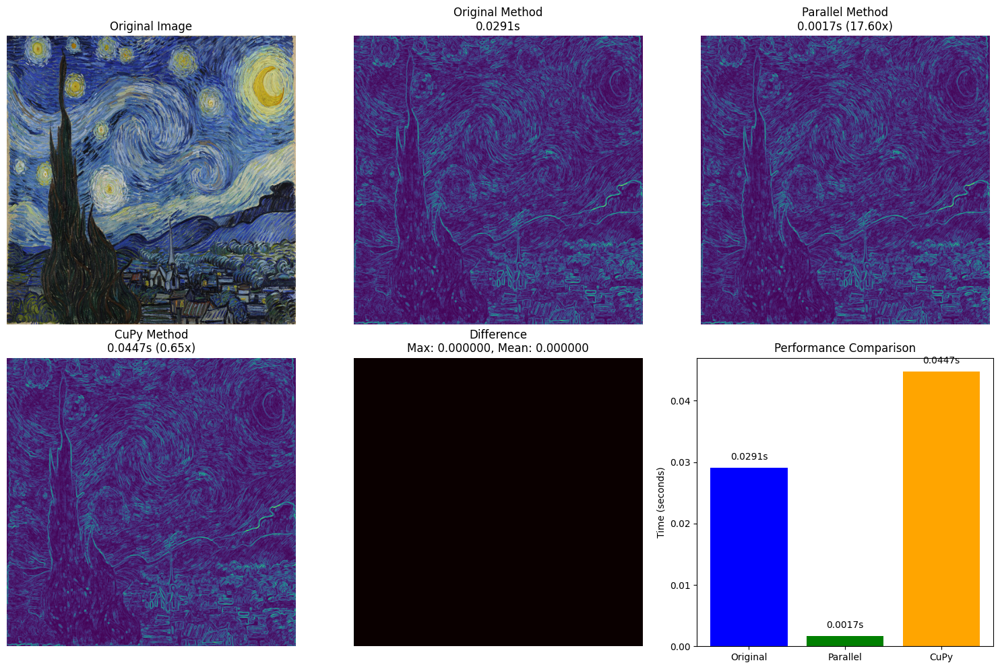



Testing with image size: 1024x1024
Loaded library: ./cuda_matlib.so
Function signatures configured
Loading image from URL: https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1200px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg
Running edge detection on 1200px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg
Image size: (1024, 1024)
Trial 1/3:
Original edge detection time: 0.0184s
Parallel edge detection time: 0.0064s
CuPy edge detection time: 0.0044s
Trial 2/3:
Original edge detection time: 0.0043s
Parallel edge detection time: 0.0065s
CuPy edge detection time: 0.0050s
Trial 3/3:
Original edge detection time: 0.0046s
Parallel edge detection time: 0.0059s
CuPy edge detection time: 0.0052s

Average Times:
Original: 0.0091s
Parallel: 0.0062s
CuPy: 0.0048s

Speedups:
Parallel vs Original: 1.46x
CuPy vs Original: 1.88x

Output Difference (Original vs Parallel):
Max difference: 0.000000
Mean difference: 0.000000


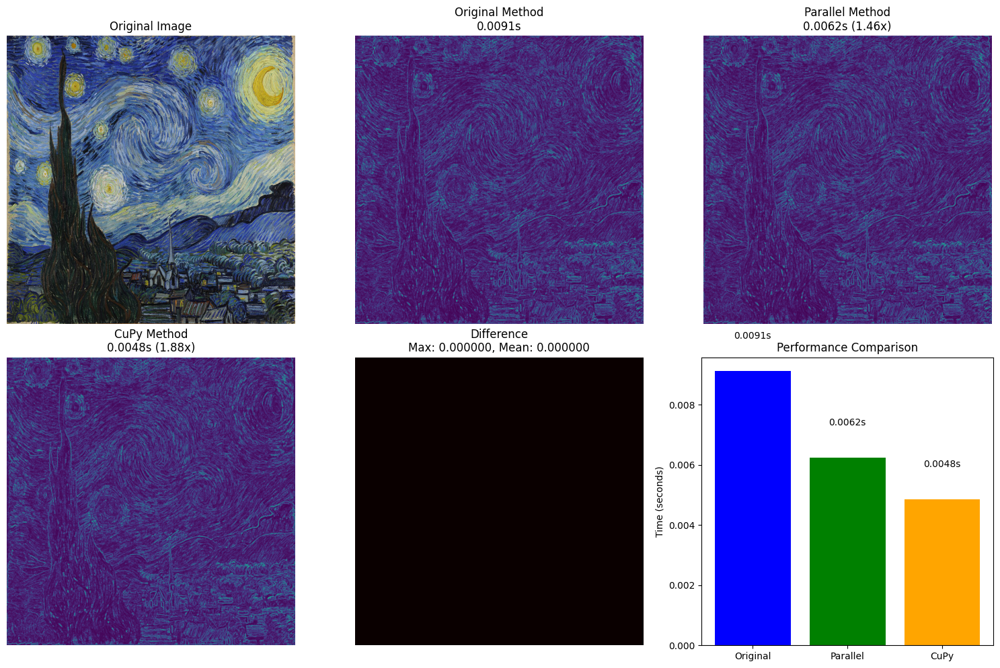



Testing with image size: 2048x2048
Loaded library: ./cuda_matlib.so
Function signatures configured
Loading image from URL: https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1200px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg
Running edge detection on 1200px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg
Image size: (2048, 2048)
Trial 1/3:
Original edge detection time: 0.0258s
Parallel edge detection time: 0.0244s
CuPy edge detection time: 0.0169s
Trial 2/3:
Original edge detection time: 0.0224s
Parallel edge detection time: 0.0245s
CuPy edge detection time: 0.0165s
Trial 3/3:
Original edge detection time: 0.0218s
Parallel edge detection time: 0.0241s
CuPy edge detection time: 0.0166s

Average Times:
Original: 0.0233s
Parallel: 0.0243s
CuPy: 0.0167s

Speedups:
Parallel vs Original: 0.96x
CuPy vs Original: 1.40x

Output Difference (Original vs Parallel):
Max difference: 0.000000
Mean difference: 0.000000


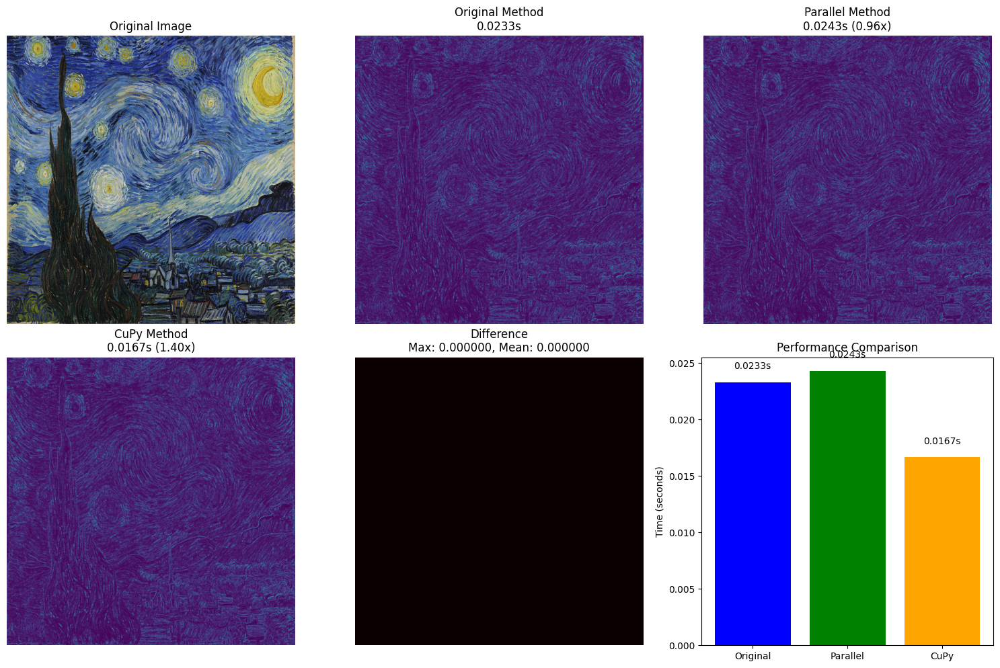

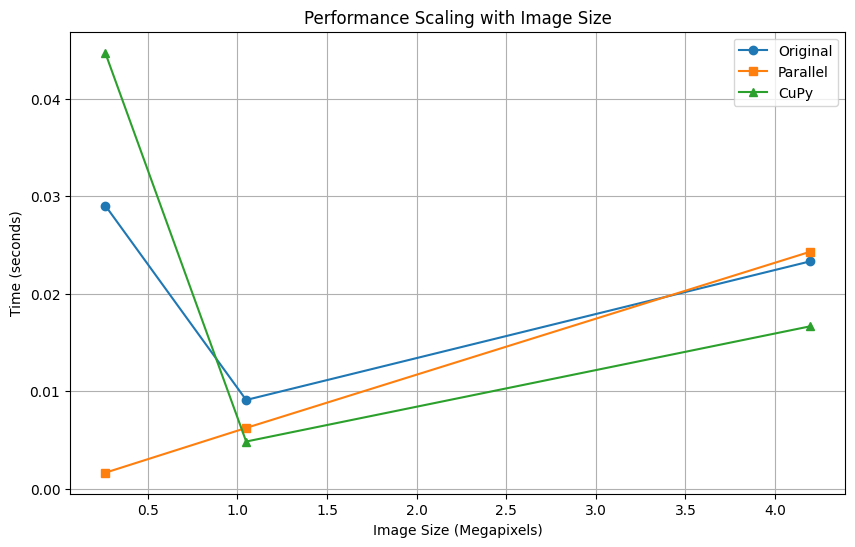

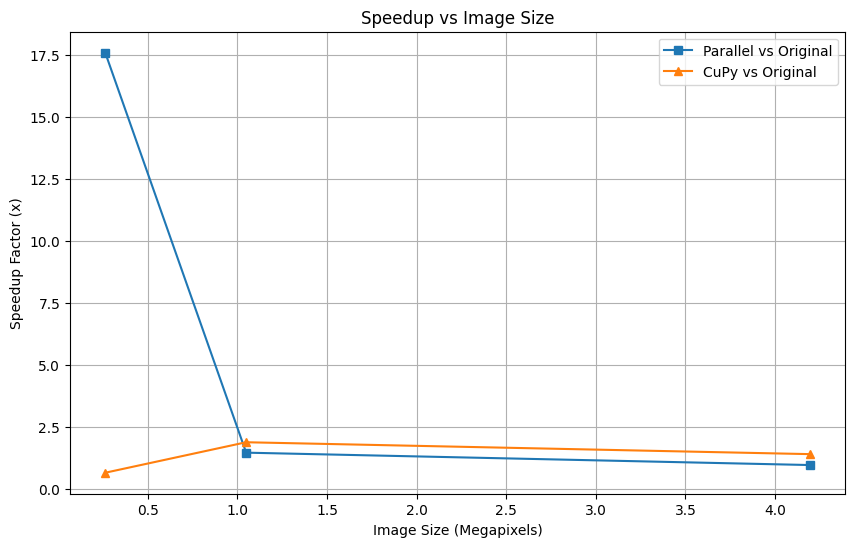

In [1]:
import numpy as np
import cupy as cp
import matplotlib.pyplot as plt
import time
import urllib.request
from io import BytesIO
from PIL import Image
import ctypes

class TensorImageOps:
    """GPU-accelerated image operations using tensor cores via CUDA Fortran."""
    
    def __init__(self, lib_path='./cuda_matlib.so'):
        try:
            # Load the library
            self.lib = ctypes.CDLL(lib_path)
            print(f"Loaded library: {lib_path}")
            
            # Set up function signatures
            self._setup_functions()
            
        except Exception as e:
            print(f"Initialization error: {e}")
            raise
    
    def _setup_functions(self):
        """Configure library function signatures."""
        # Original edge detection function
        self.lib.py_edge_detection_tensor.argtypes = [
            ctypes.c_void_p,    # Input image
            ctypes.c_void_p,    # Output result
            ctypes.c_int,       # height
            ctypes.c_int        # width
        ]
        self.lib.py_edge_detection_tensor.restype = None
        
        # Parallel edge detection function
        self.lib.py_edge_detection_parallel.argtypes = [
            ctypes.c_void_p,    # Input image
            ctypes.c_void_p,    # Output result
            ctypes.c_int,       # height
            ctypes.c_int        # width
        ]
        self.lib.py_edge_detection_parallel.restype = None
        
        print("Function signatures configured")
    
    def original_edge_detection(self, image):
        """Perform edge detection using the original method."""
        # Convert to grayscale if needed
        if image.ndim == 3:
            gray_image = np.mean(image, axis=2)
        else:
            gray_image = image
        
        gray_image = gray_image.astype(np.float64)
        
        # Ensure input is device array
        image_d = cp.asarray(gray_image, dtype=cp.float64)
        
        # Get dimensions
        height, width = image_d.shape
        
        # Create output array
        result_d = cp.zeros_like(image_d)
        
        # Call the Fortran edge detection function
        start_time = time.time()
        self.lib.py_edge_detection_tensor(
            ctypes.c_void_p(image_d.data.ptr),
            ctypes.c_void_p(result_d.data.ptr),
            ctypes.c_int(height),
            ctypes.c_int(width)
        )
        
        # Ensure operation is complete
        cp.cuda.runtime.deviceSynchronize()
        end_time = time.time()
        
        # Return result and timing
        return cp.asnumpy(result_d), end_time - start_time
    
    def parallel_edge_detection(self, image):
        """Perform edge detection using the parallel method."""
        # Convert to grayscale if needed
        if image.ndim == 3:
            gray_image = np.mean(image, axis=2)
        else:
            gray_image = image
        
        gray_image = gray_image.astype(np.float64)
        
        # Ensure input is device array
        image_d = cp.asarray(gray_image, dtype=cp.float64)
        
        # Get dimensions
        height, width = image_d.shape
        
        # Create output array
        result_d = cp.zeros_like(image_d)
        
        # Call the parallel Fortran edge detection function
        start_time = time.time()
        self.lib.py_edge_detection_parallel(
            ctypes.c_void_p(image_d.data.ptr),
            ctypes.c_void_p(result_d.data.ptr),
            ctypes.c_int(height),
            ctypes.c_int(width)
        )
        
        # Ensure operation is complete
        cp.cuda.runtime.deviceSynchronize()
        end_time = time.time()
        
        # Return result and timing
        return cp.asnumpy(result_d), end_time - start_time
    
    def edge_detection_cupy(self, image):
        """Perform edge detection using CuPy for reference."""
        # Convert to grayscale if needed
        if image.ndim == 3:
            gray_image = np.mean(image, axis=2)
        else:
            gray_image = image
            
        # Move to GPU
        image_d = cp.asarray(gray_image, dtype=cp.float64)
        
        # Create Sobel kernels
        sobel_x = cp.array([
            [-1.0, 0.0, 1.0],
            [-2.0, 0.0, 2.0],
            [-1.0, 0.0, 1.0]
        ], dtype=cp.float64)
        
        sobel_y = cp.array([
            [-1.0, -2.0, -1.0],
            [0.0, 0.0, 0.0],
            [1.0, 2.0, 1.0]
        ], dtype=cp.float64)
        
        # Perform convolution
        start_time = time.time()
        
        # Using cupyx.scipy.ndimage for convolution
        import cupyx.scipy.ndimage
        grad_x = cupyx.scipy.ndimage.correlate(image_d, sobel_x, mode='reflect')
        grad_y = cupyx.scipy.ndimage.correlate(image_d, sobel_y, mode='reflect')
        
        # Compute magnitude
        magnitude = cp.sqrt(grad_x**2 + grad_y**2)
        
        # Normalize
        if cp.max(magnitude) > 0:
            magnitude = magnitude / cp.max(magnitude)
            
        # Synchronize to ensure timing is accurate
        cp.cuda.runtime.deviceSynchronize()
        end_time = time.time()
        
        return cp.asnumpy(magnitude), end_time - start_time

def load_image(url=None, path=None, size=(1024, 1024)):
    """Load an image from URL or path, resize, and ensure color."""
    # Load image
    if url:
        print(f"Loading image from URL: {url}")
        with urllib.request.urlopen(url) as response:
            img = Image.open(BytesIO(response.read()))
    elif path:
        print(f"Loading image from path: {path}")
        img = Image.open(path)
    else:
        raise ValueError("Must provide either a URL or a path")
    
    # Resize image
    img = img.resize(size)
    
    # Convert to RGB if not already
    if img.mode != 'RGB':
        img = img.convert('RGB')
    
    # Convert to numpy array and normalize
    return np.array(img, dtype=np.float64) / 255.0

def compare_performance(image_url, image_size=(1024, 1024)):
    """Compare performance of different edge detection implementations."""
    tensor_ops = TensorImageOps()
    
    # Load image
    img = load_image(url=image_url, size=image_size)
    
    print(f"Running edge detection on {image_url.split('/')[-1]}")
    print(f"Image size: {img.shape[:2]}")
    
    # Run multiple trials for more reliable timing
    num_trials = 3
    original_times = []
    parallel_times = []
    cupy_times = []
    
    for i in range(num_trials):
        print(f"Trial {i+1}/{num_trials}:")
        
        # Original method
        result1, time1 = tensor_ops.original_edge_detection(img)
        original_times.append(time1)
        print(f"Original edge detection time: {time1:.4f}s")
        
        # Parallel method
        result2, time2 = tensor_ops.parallel_edge_detection(img)
        parallel_times.append(time2)
        print(f"Parallel edge detection time: {time2:.4f}s")
        
        # CuPy reference method
        result3, time3 = tensor_ops.edge_detection_cupy(img)
        cupy_times.append(time3)
        print(f"CuPy edge detection time: {time3:.4f}s")
        
        # Quick memory cleanup between trials
        cp.get_default_memory_pool().free_all_blocks()
    
    # Calculate average times
    avg_original = sum(original_times) / num_trials
    avg_parallel = sum(parallel_times) / num_trials
    avg_cupy = sum(cupy_times) / num_trials
    
    # Calculate speedups
    speedup_parallel = avg_original / avg_parallel
    speedup_cupy = avg_original / avg_cupy
    
    print("\nAverage Times:")
    print(f"Original: {avg_original:.4f}s")
    print(f"Parallel: {avg_parallel:.4f}s")
    print(f"CuPy: {avg_cupy:.4f}s")
    
    print("\nSpeedups:")
    print(f"Parallel vs Original: {speedup_parallel:.2f}x")
    print(f"CuPy vs Original: {speedup_cupy:.2f}x")
    
    # Check for any differences in output
    diff = np.abs(result1 - result2)
    max_diff = np.max(diff)
    mean_diff = np.mean(diff)
    print(f"\nOutput Difference (Original vs Parallel):")
    print(f"Max difference: {max_diff:.6f}")
    print(f"Mean difference: {mean_diff:.6f}")
    
    # Plot results
    plt.figure(figsize=(15, 10))
    
    plt.subplot(2, 3, 1)
    plt.imshow(img)
    plt.title("Original Image")
    plt.axis('off')
    
    plt.subplot(2, 3, 2)
    plt.imshow(result1, cmap='viridis')
    plt.title(f"Original Method\n{avg_original:.4f}s")
    plt.axis('off')
    
    plt.subplot(2, 3, 3)
    plt.imshow(result2, cmap='viridis')
    plt.title(f"Parallel Method\n{avg_parallel:.4f}s ({speedup_parallel:.2f}x)")
    plt.axis('off')
    
    plt.subplot(2, 3, 4)
    plt.imshow(result3, cmap='viridis')
    plt.title(f"CuPy Method\n{avg_cupy:.4f}s ({speedup_cupy:.2f}x)")
    plt.axis('off')
    
    plt.subplot(2, 3, 5)
    plt.imshow(diff, cmap='hot')
    plt.title(f"Difference\nMax: {max_diff:.6f}, Mean: {mean_diff:.6f}")
    plt.axis('off')
    
    # Bar chart of performance
    plt.subplot(2, 3, 6)
    methods = ['Original', 'Parallel', 'CuPy']
    times = [avg_original, avg_parallel, avg_cupy]
    bars = plt.bar(methods, times, color=['blue', 'green', 'orange'])
    plt.ylabel('Time (seconds)')
    plt.title('Performance Comparison')
    
    # Add time labels on top of bars
    for bar, time_val in zip(bars, times):
        plt.text(bar.get_x() + bar.get_width()/2., time_val + 0.001,
                f'{time_val:.4f}s', ha='center', va='bottom')
    
    plt.tight_layout()
    plt.savefig(f"edge_detection_performance_{image_size[0]}x{image_size[1]}.png", dpi=300)
    plt.show()
    
    return {
        "original": {"result": result1, "time": avg_original},
        "parallel": {"result": result2, "time": avg_parallel},
        "cupy": {"result": result3, "time": avg_cupy}
    }

def test_different_sizes():
    """Test performance on different image sizes."""
    test_image = "https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1200px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg"
    
    # Test different sizes
    sizes = [(512, 512), (1024, 1024), (2048, 2048)]
    
    results = {}
    for size in sizes:
        print(f"\n\nTesting with image size: {size[0]}x{size[1]}")
        results[size] = compare_performance(test_image, size)
    
    # Compile and plot scaling results
    original_times = [results[size]["original"]["time"] for size in sizes]
    parallel_times = [results[size]["parallel"]["time"] for size in sizes]
    cupy_times = [results[size]["cupy"]["time"] for size in sizes]
    
    # Plot scaling behavior
    plt.figure(figsize=(10, 6))
    
    # Convert sizes to megapixels for plotting
    megapixels = [(size[0] * size[1]) / 1_000_000 for size in sizes]
    
    plt.plot(megapixels, original_times, 'o-', label='Original')
    plt.plot(megapixels, parallel_times, 's-', label='Parallel')
    plt.plot(megapixels, cupy_times, '^-', label='CuPy')
    
    plt.xlabel('Image Size (Megapixels)')
    plt.ylabel('Time (seconds)')
    plt.title('Performance Scaling with Image Size')
    plt.legend()
    plt.grid(True)
    
    plt.savefig("edge_detection_scaling.png", dpi=300)
    plt.show()
    
    # Calculate speedups at each size
    speedups_parallel = [original_times[i]/parallel_times[i] for i in range(len(sizes))]
    speedups_cupy = [original_times[i]/cupy_times[i] for i in range(len(sizes))]
    
    plt.figure(figsize=(10, 6))
    plt.plot(megapixels, speedups_parallel, 's-', label='Parallel vs Original')
    plt.plot(megapixels, speedups_cupy, '^-', label='CuPy vs Original')
    
    plt.xlabel('Image Size (Megapixels)')
    plt.ylabel('Speedup Factor (x)')
    plt.title('Speedup vs Image Size')
    plt.legend()
    plt.grid(True)
    
    plt.savefig("edge_detection_speedups.png", dpi=300)
    plt.show()
    
    return results

if __name__ == "__main__":
    # Test performance on different image sizes
    results = test_different_sizes()

Loading image from URL: https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1200px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg
Library last modified: Wed Mar  5 14:32:22 2025
Loaded library: ./cuda_matlib.so
Running parallel edge detection on 1024x1024 image
Detection completed in 0.0050 seconds


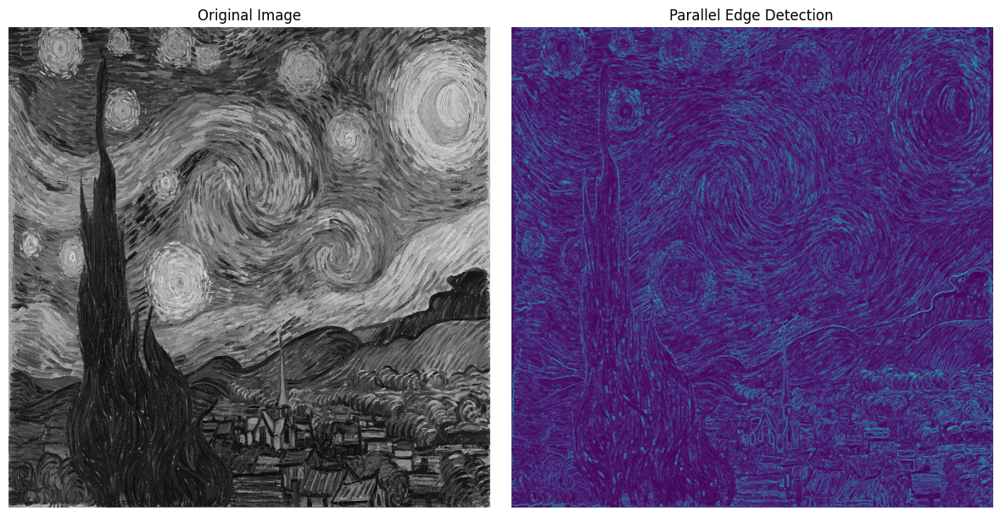

In [2]:
import numpy as np
import cupy as cp
import matplotlib.pyplot as plt
import time
import urllib.request
from io import BytesIO
from PIL import Image
import ctypes
import os

def load_image(url, size=(1024, 1024)):
    """Load an image from URL, resize, and convert to grayscale."""
    print(f"Loading image from URL: {url}")
    with urllib.request.urlopen(url) as response:
        img = Image.open(BytesIO(response.read()))
    
    # Resize and convert to grayscale
    img = img.resize(size).convert('L')
    
    # Convert to numpy array and normalize
    return np.array(img, dtype=np.float64) / 255.0

class ParallelEdgeDetector:
    """Minimal class that only uses parallel edge detection."""
    
    def __init__(self, lib_path='./cuda_matlib.so'):
        # Get file modification time to verify we're using the latest version
        self.lib_mtime = os.path.getmtime(lib_path)
        print(f"Library last modified: {time.ctime(self.lib_mtime)}")
        
        # Load the library
        self.lib = ctypes.CDLL(lib_path)
        print(f"Loaded library: {lib_path}")
        
        # Set up just the parallel function
        self.lib.py_edge_detection_parallel.argtypes = [
            ctypes.c_void_p,    # Input image
            ctypes.c_void_p,    # Output result
            ctypes.c_int,       # height
            ctypes.c_int        # width
        ]
        self.lib.py_edge_detection_parallel.restype = None
    
    def detect_edges(self, image):
        """Run parallel edge detection on the image."""
        # Ensure input is double precision
        image = image.astype(np.float64)
        
        # Move to GPU
        image_d = cp.asarray(image, dtype=cp.float64)
        
        # Get dimensions
        height, width = image_d.shape
        
        # Create output array
        result_d = cp.zeros_like(image_d)
        
        print(f"Running parallel edge detection on {height}x{width} image")
        
        # Call the parallel function
        start_time = time.time()
        self.lib.py_edge_detection_parallel(
            ctypes.c_void_p(image_d.data.ptr),
            ctypes.c_void_p(result_d.data.ptr),
            ctypes.c_int(height),
            ctypes.c_int(width)
        )
        
        # Ensure computation is complete
        cp.cuda.runtime.deviceSynchronize()
        elapsed = time.time() - start_time
        print(f"Detection completed in {elapsed:.4f} seconds")
        
        # Return as numpy array
        return cp.asnumpy(result_d)

def main():
    # Use a simple test image
    test_image = "https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1200px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg"
    
    # Load image
    img = load_image(test_image, size=(1024, 1024))
    
    # Create edge detector
    detector = ParallelEdgeDetector()
    
    # Detect edges
    result = detector.detect_edges(img)
    
    # Display results
    plt.figure(figsize=(12, 6))
    
    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap='gray')
    plt.title("Original Image")
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(result, cmap='viridis')
    plt.title("Parallel Edge Detection")
    plt.axis('off')
    
    plt.tight_layout()
    plt.savefig("parallel_edge_detection_test.png", dpi=300)
    plt.show()

if __name__ == "__main__":
    main()

Loaded library: ./cuda_matlib.so
Parameter setting not supported

Processing Starry Night...
Loading image from URL: https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1200px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg
  Running warm-up iterations...
  Benchmarking CPU implementation...
    Iteration 1: 0.3492s
    Iteration 2: 0.3280s
    Iteration 3: 0.3102s
  Benchmarking CuPy implementation...
    Iteration 1: 0.0177s
    Iteration 2: 0.0184s
    Iteration 3: 0.0177s
  Benchmarking Tensor Core implementation...
    Iteration 1: 0.1054s
    Iteration 2: 0.1039s
    Iteration 3: 0.1053s

  Result Comparison:
    CPU vs CuPy:        Max diff: 0.000000, Mean diff: 0.000000
    CPU vs Tensor Core: Max diff: 0.323237, Mean diff: 0.000052
    CuPy vs Tensor Core: Max diff: 0.323237, Mean diff: 0.000052

Processing The Great Wave...
Loading image from URL: https://upload.wikimedia.org/wikipedia/commons/thumb/a/a5/Tsunami_by_hokus

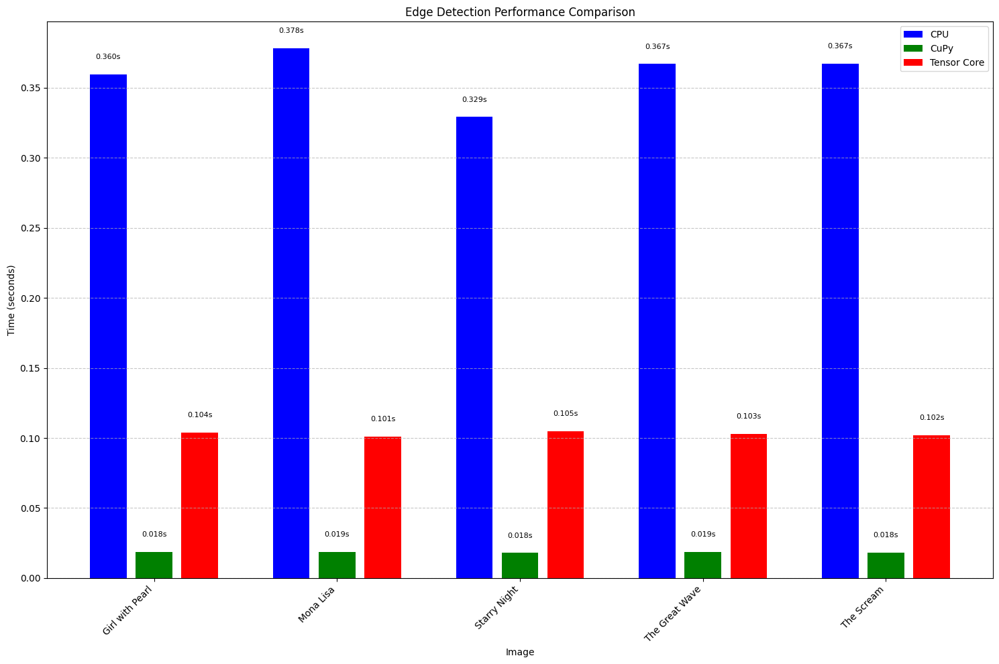

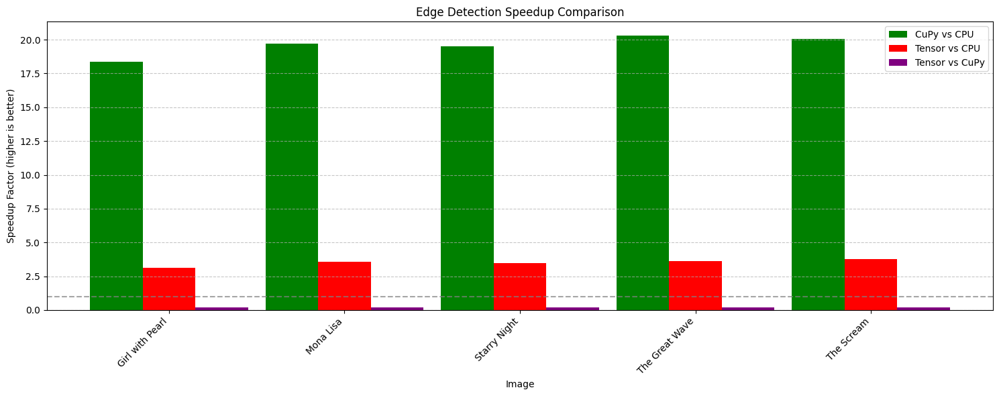

In [3]:
import numpy as np
import cupy as cp
import matplotlib.pyplot as plt
import time
import ctypes
import urllib.request
from io import BytesIO
from PIL import Image
from scipy import ndimage
import pandas as pd
from tabulate import tabulate

class TensorImageOps:
    """GPU-accelerated image operations using tensor cores via CUDA Fortran."""
    
    def __init__(self, lib_path='./cuda_matlib.so'):
        try:
            # Load the library
            self.lib = ctypes.CDLL(lib_path)
            print(f"Loaded library: {lib_path}")
            
            # Set up function signatures
            self._setup_functions()
            
        except Exception as e:
            print(f"Initialization error: {e}")
            raise
    
    def _setup_functions(self):
        """Configure library function signatures."""
        # Edge detection function
        self.lib.py_edge_detection_tensor.argtypes = [
            ctypes.c_void_p,    # Input image
            ctypes.c_void_p,    # Output result
            ctypes.c_int,       # height
            ctypes.c_int        # width
        ]
        self.lib.py_edge_detection_tensor.restype = None
        
        # Parameter configuration function
        try:
            self.lib.set_tensor_core_parameters.argtypes = [
                ctypes.c_int,    # batch_size
                ctypes.c_int,    # tile_size
                ctypes.c_int,    # max_streams
                ctypes.c_int     # num_iterations
            ]
            self.lib.set_tensor_core_parameters.restype = None
            self.has_param_function = True
            print("Parameter configuration function found")
        except AttributeError:
            self.has_param_function = False
            print("Warning: Parameter configuration function not found")
    
    def set_parameters(self, batch_size=256, tile_size=16, max_streams=4, num_iterations=1):
        """Set tensor core parameters."""
        if self.has_param_function:
            try:
                self.lib.set_tensor_core_parameters(
                    ctypes.c_int(batch_size),
                    ctypes.c_int(tile_size),
                    ctypes.c_int(max_streams),
                    ctypes.c_int(num_iterations)
                )
                print(f"Parameters set: batch_size={batch_size}, tile_size={tile_size}, "
                      f"max_streams={max_streams}, num_iterations={num_iterations}")
                return True
            except Exception as e:
                print(f"Error setting parameters: {e}")
                return False
        else:
            print("Parameter setting not supported")
            return False
    
    def edge_detection(self, image):
        """Perform edge detection using tensor cores."""
        # Convert to grayscale if needed
        if image.ndim == 3:
            gray_image = np.mean(image, axis=2)
        else:
            gray_image = image
        
        gray_image = gray_image.astype(np.float64)
        
        # Ensure input is device array
        image_d = cp.asarray(gray_image, dtype=cp.float64)
        
        # Get dimensions
        height, width = image_d.shape
        
        # Create output array
        result_d = cp.zeros_like(image_d)
        
        # Call the Fortran edge detection function
        self.lib.py_edge_detection_tensor(
            ctypes.c_void_p(image_d.data.ptr),
            ctypes.c_void_p(result_d.data.ptr),
            ctypes.c_int(height),
            ctypes.c_int(width)
        )
        
        # Ensure operation is complete
        cp.cuda.runtime.deviceSynchronize()
        
        # Return result
        return cp.asnumpy(result_d)

def load_image(url=None, path=None, size=(2048, 2048)):
    """Load an image from URL or path, resize, and ensure color."""
    # Load image
    if url:
        print(f"Loading image from URL: {url}")
        with urllib.request.urlopen(url) as response:
            img = Image.open(BytesIO(response.read()))
    elif path:
        print(f"Loading image from path: {path}")
        img = Image.open(path)
    else:
        raise ValueError("Must provide either a URL or a path")
    
    # Resize image
    img = img.resize(size, Image.LANCZOS)
    
    # Convert to RGB if not already
    if img.mode != 'RGB':
        img = img.convert('RGB')
    
    # Convert to numpy array and normalize
    return np.array(img, dtype=np.float64) / 255.0

def prepare_for_display(image):
    """Ensure image is in a displayable format."""
    # Clip values to 0-1 range
    image = np.clip(image, 0, 1)
    return image

def cpu_edge_detection(image):
    """Perform edge detection using CPU."""
    sobel_x = ndimage.sobel(image, axis=0)
    sobel_y = ndimage.sobel(image, axis=1)
    return np.hypot(sobel_x, sobel_y) / np.max(np.hypot(sobel_x, sobel_y))

def cupy_edge_detection(image):
    """Perform edge detection using CuPy."""
    # Convert to CuPy array
    image_d = cp.asarray(image)
    
    # Create Sobel kernels
    sobel_x = cp.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=cp.float64)
    sobel_y = cp.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype=cp.float64)
    
    # Apply convolution
    import cupyx.scipy.ndimage
    grad_x = cupyx.scipy.ndimage.convolve(image_d, sobel_x, mode='reflect')
    grad_y = cupyx.scipy.ndimage.convolve(image_d, sobel_y, mode='reflect')
    
    # Compute magnitude
    result = cp.hypot(grad_x, grad_y)
    
    # Normalize
    result = result / cp.max(result)
    
    # Ensure computation is complete
    cp.cuda.runtime.deviceSynchronize()
    
    return cp.asnumpy(result)

def benchmark_edge_detection(images, iterations=3, tensor_params=None):
    """Run benchmarks for multiple implementations of edge detection."""
    # Initialize Tensor Ops
    tensor_ops = TensorImageOps()
    
    # Set tensor core parameters if provided
    if tensor_params:
        tensor_ops.set_parameters(**tensor_params)
    
    # Create DataFrame to store results
    columns = ['Image', 'Method', 'Iteration', 'Time (s)']
    results = []
    
    # Run benchmarks for each image
    for name, url in images.items():
        print(f"\nProcessing {name}...")
        
        # Load image
        image = load_image(url=url, size=(2048, 2048))
        gray_image = np.mean(image, axis=2)
        
        # Run warm-up iterations for all methods (not timed)
        print("  Running warm-up iterations...")
        _ = cpu_edge_detection(gray_image)
        _ = cupy_edge_detection(gray_image)
        _ = tensor_ops.edge_detection(image)
        
        # Benchmark CPU implementation
        print("  Benchmarking CPU implementation...")
        for i in range(iterations):
            start_time = time.time()
            cpu_result = cpu_edge_detection(gray_image)
            cpu_time = time.time() - start_time
            results.append([name, 'CPU', i+1, cpu_time])
            print(f"    Iteration {i+1}: {cpu_time:.4f}s")
        
        # Benchmark CuPy implementation
        print("  Benchmarking CuPy implementation...")
        for i in range(iterations):
            start_time = time.time()
            cupy_result = cupy_edge_detection(gray_image)
            cupy_time = time.time() - start_time
            results.append([name, 'CuPy', i+1, cupy_time])
            print(f"    Iteration {i+1}: {cupy_time:.4f}s")
        
        # Benchmark Tensor Core implementation
        print("  Benchmarking Tensor Core implementation...")
        for i in range(iterations):
            start_time = time.time()
            tensor_result = tensor_ops.edge_detection(image)
            tensor_time = time.time() - start_time
            results.append([name, 'Tensor Core', i+1, tensor_time])
            print(f"    Iteration {i+1}: {tensor_time:.4f}s")
        
        # Compare results (using the last run from each method)
        diff_cpu_cupy = np.abs(cpu_result - cupy_result)
        diff_cpu_tensor = np.abs(cpu_result - tensor_result)
        diff_cupy_tensor = np.abs(cupy_result - tensor_result)
        
        print("\n  Result Comparison:")
        print(f"    CPU vs CuPy:        Max diff: {np.max(diff_cpu_cupy):.6f}, Mean diff: {np.mean(diff_cpu_cupy):.6f}")
        print(f"    CPU vs Tensor Core: Max diff: {np.max(diff_cpu_tensor):.6f}, Mean diff: {np.mean(diff_cpu_tensor):.6f}")
        print(f"    CuPy vs Tensor Core: Max diff: {np.max(diff_cupy_tensor):.6f}, Mean diff: {np.mean(diff_cupy_tensor):.6f}")
    
    # Convert results to DataFrame
    df = pd.DataFrame(results, columns=columns)
    
    # Calculate average times by image and method
    avg_df = df.groupby(['Image', 'Method'])['Time (s)'].agg(['mean', 'min', 'max', 'std']).reset_index()
    
    # Print summary table
    print("\nSummary of Results (Average Times):")
    print(tabulate(avg_df, headers='keys', tablefmt='grid', floatfmt='.4f'))
    
    # Calculate speedups
    speedup_data = []
    for name in images.keys():
        image_df = df[df['Image'] == name]
        
        # Calculate average time for each method
        cpu_time = image_df[image_df['Method'] == 'CPU']['Time (s)'].mean()
        cupy_time = image_df[image_df['Method'] == 'CuPy']['Time (s)'].mean()
        tensor_time = image_df[image_df['Method'] == 'Tensor Core']['Time (s)'].mean()
        
        # Calculate speedups
        cupy_vs_cpu = cpu_time / cupy_time if cupy_time > 0 else float('inf')
        tensor_vs_cpu = cpu_time / tensor_time if tensor_time > 0 else float('inf')
        tensor_vs_cupy = cupy_time / tensor_time if tensor_time > 0 else float('inf')
        
        speedup_data.append([
            name, cpu_time, cupy_time, tensor_time,
            cupy_vs_cpu, tensor_vs_cpu, tensor_vs_cupy
        ])
    
    # Create speedup DataFrame
    speedup_df = pd.DataFrame(speedup_data, columns=[
        'Image', 'CPU Time', 'CuPy Time', 'Tensor Time',
        'CuPy vs CPU', 'Tensor vs CPU', 'Tensor vs CuPy'
    ])
    
    # Print speedup table
    print("\nSpeedup Summary:")
    print(tabulate(speedup_df, headers='keys', tablefmt='grid', floatfmt='.4f'))
    
    # Create combined visualization
    plt.figure(figsize=(15, 10))
    
    # Extract data for plotting
    images = sorted(df['Image'].unique())
    n_images = len(images)
    methods = ['CPU', 'CuPy', 'Tensor Core']
    colors = ['blue', 'green', 'red']
    
    for i, method in enumerate(methods):
        # Get average times for this method
        times = [avg_df[(avg_df['Image'] == img) & (avg_df['Method'] == method)]['mean'].values[0] 
                 for img in images]
        
        # Plot bar
        x = np.arange(n_images) + i*0.25 - 0.25
        bars = plt.bar(x, times, width=0.2, color=colors[i], label=method)
        
        # Add text annotations
        for j, bar in enumerate(bars):
            plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                     f"{times[j]:.3f}s", ha='center', va='bottom', fontsize=8)
    
    # Add labels and legend
    plt.xlabel('Image')
    plt.ylabel('Time (seconds)')
    plt.title('Edge Detection Performance Comparison')
    plt.xticks(np.arange(n_images), images, rotation=45, ha='right')
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    plt.savefig('edge_detection_benchmark.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # Create speedup visualization
    plt.figure(figsize=(15, 6))
    
    # Create a bar chart for speedups
    x = np.arange(n_images)
    width = 0.3
    
    # Plot speedups
    plt.bar(x - width, speedup_df['CuPy vs CPU'], width, label='CuPy vs CPU', color='green')
    plt.bar(x, speedup_df['Tensor vs CPU'], width, label='Tensor vs CPU', color='red')
    plt.bar(x + width, speedup_df['Tensor vs CuPy'], width, label='Tensor vs CuPy', color='purple')
    
    # Add labels and legend
    plt.xlabel('Image')
    plt.ylabel('Speedup Factor (higher is better)')
    plt.title('Edge Detection Speedup Comparison')
    plt.xticks(x, images, rotation=45, ha='right')
    plt.axhline(y=1.0, color='gray', linestyle='--', alpha=0.7)
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    plt.savefig('edge_detection_speedup.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    return df, avg_df, speedup_df

# Main entry point
if __name__ == "__main__":
    # Define images to test
    images = {
        "Starry Night": "https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1200px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg",
        "The Great Wave": "https://upload.wikimedia.org/wikipedia/commons/thumb/a/a5/Tsunami_by_hokusai_19th_century.jpg/1200px-Tsunami_by_hokusai_19th_century.jpg",
        "Girl with Pearl": "https://upload.wikimedia.org/wikipedia/commons/thumb/0/0f/1665_Girl_with_a_Pearl_Earring.jpg/800px-1665_Girl_with_a_Pearl_Earring.jpg",
        "The Scream": "https://upload.wikimedia.org/wikipedia/commons/thumb/f/f4/The_Scream.jpg/1200px-The_Scream.jpg",
        "Mona Lisa": "https://upload.wikimedia.org/wikipedia/commons/thumb/e/ec/Mona_Lisa%2C_by_Leonardo_da_Vinci%2C_from_C2RMF_retouched.jpg/800px-Mona_Lisa%2C_by_Leonardo_da_Vinci%2C_from_C2RMF_retouched.jpg"
    }
    
    # Set tensor core parameters
    tensor_params = {
        'batch_size': 64,
        'tile_size': 16,
        'max_streams': 4,
        'num_iterations': 2
    }
    
    # Run benchmarks
    results, avg_results, speedups = benchmark_edge_detection(
        images, 
        iterations=3,
        tensor_params=tensor_params
    )